# Flight Price Prediction


# Problem Statement
Flight ticket prices can be something hard to guess, today we might see a price, check out the price of the same flight tomorrow, it will be a different story. We might have often heard travelers saying that flight ticket prices are so unpredictable. That's why we will try to use machine learning to solve this problem. This can help airlines by predicting what prices thay can maintain.  

# Importing Basic libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Loading the Dataset
data=pd.read_excel("Flight_Fare.xlsx")

In [3]:
data

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648


# Domain Analysis
# 1. Airline:
* Airline column will have all the types of airlines like Indigo, Jet Airways, Air India, and many more.
# 2. Date_of_Journey: 
* Date on which the passenger’s journey will start.
# 3. Source: 
* Name of the place from where the passenger’s journey will start.
# 4. Destination: 
* The name of the place to where passengers wanted to travel.
# 5. Route: 
* The route is through which passengers have opted to travel from his/her source to their destination.
# 6. Arrival Time: 
* Time is when the passenger will reach his/her destination.
# 7. Duration: 
* Period that a flight will take to complete its journey from source to destination.
# 8. Total Stops: 
* How many places flights will stop there for the flight in the whole journey.
# 9. Additional Info: 
* we will get information about food, kind of food, and other amenities.
# 10. Price: 
* Price of the flight for a complete journey including all the expenses before onboarding.

# Basic Checks

In [4]:
# Basic Checks  
#Information of dataset, checking datatypes.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [5]:
#First 5 Rows
data.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302


In [6]:
data.shape

(10683, 11)

In [7]:
# last 5 rows
data.tail()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648
10682,Air India,9/05/2019,Delhi,Cochin,DEL → GOI → BOM → COK,10:55,19:15,8h 20m,2 stops,No info,11753


In [8]:
#Display all the rows
pd.set_option('display.max_rows',None)

In [9]:
data

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1 stop,In-flight meal not included,11087
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1 stop,No info,22270
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1 stop,In-flight meal not included,11087
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1 stop,No info,8625


In [10]:
## Getting all columns form the dataset
data.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [11]:
##used to view some basic statistical details like percentile, mean, std etc.
# Since the dataset has only one numerical column,the describe() will display statistical details only for the "Price" column.
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,10683.0,9087.064121,4611.359167,1759.0,5277.0,8372.0,12373.0,79512.0


In [12]:
data.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

# Exploratory Data Analysis(EDA)

In [13]:
## Univariate Analysis
!pip install sweetviz 
#installing sweetviz library`

In [14]:
import sweetviz as sv#importing sweetviz library
my_report = sv.analyze(data)#syntax to use sweetviz
my_report.show_html()#Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


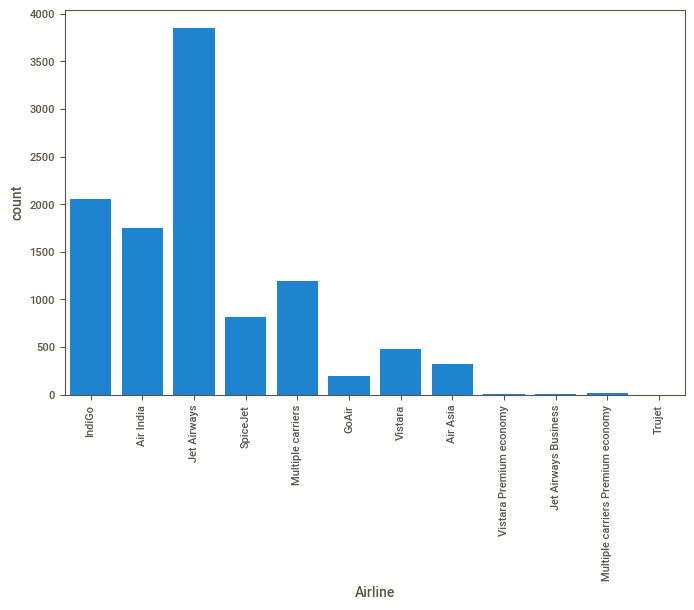

In [15]:
#Bar chart showing most preferred airlines
##A countplot basically counts the categories and returns a
# count of their occurrences.
plt.figure(figsize=(8,5))
sns.countplot(x='Airline',data=data)
plt.xticks(rotation=90)
plt.show()

# Insights
* Most Preferred Airline is "Jet Airways".
* From all the total flights tickets sold, Jet Airways has the highest share followed by indigo.
* "Jet Airways Bussinesss" and "Vistara Premium economy" have sold very less tickets.

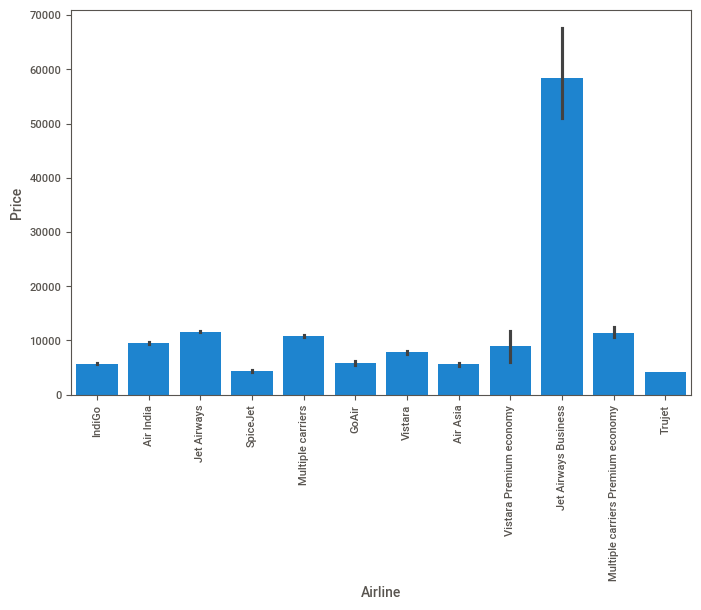

In [16]:
#Airline vs Price
##A barplot is basically used to aggregate the categorical data according to some methods and 
#by default its the mean.
#To use this plot we choose a categorical column for the x axis and a numerical column for the y axis and we see that it
# creates a plot taking a mean per categorical column.
plt.figure(figsize=(8,5))
sns.barplot(x='Airline',y='Price',data=data)
plt.xticks(rotation=90)
plt.show()

# Insights
* "Jet Airways Business" tickets are the most expensive ones.
* "Spicejet" and "Trujet" tickets are cheaper ones compare to others.

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'IndiGo'),
  Text(1, 0, 'Air India'),
  Text(2, 0, 'Jet Airways'),
  Text(3, 0, 'SpiceJet'),
  Text(4, 0, 'Multiple carriers'),
  Text(5, 0, 'GoAir'),
  Text(6, 0, 'Vistara'),
  Text(7, 0, 'Air Asia'),
  Text(8, 0, 'Vistara Premium economy'),
  Text(9, 0, 'Jet Airways Business'),
  Text(10, 0, 'Multiple carriers Premium economy'),
  Text(11, 0, 'Trujet')])

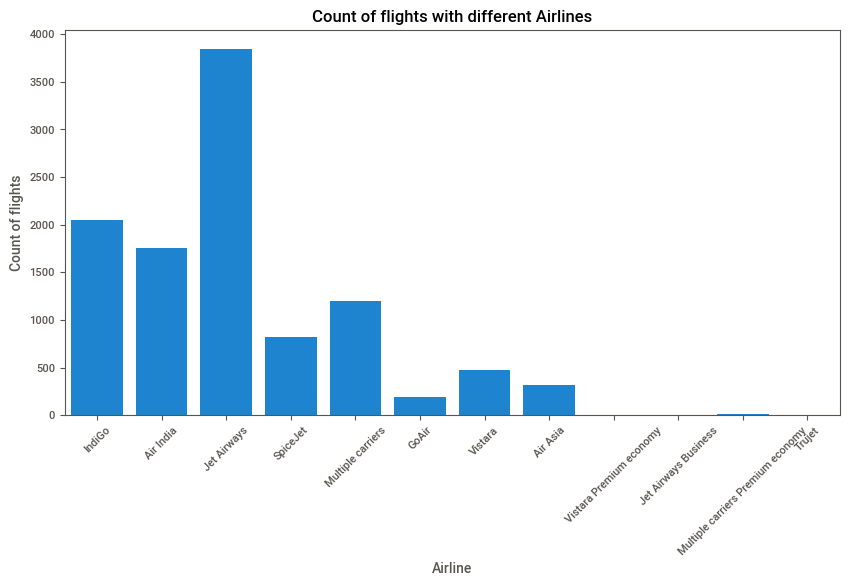

In [17]:
#Plotting bar chart For Types of Airline vs no.of flights
plt.figure(figsize=(10,5))
plt.title('Count of flights with different Airlines')
ax=sns.countplot(x='Airline',data=data)
plt.xlabel('Airline')
plt.ylabel('Count of flights')
plt.xticks(rotation=45)

# Insights
* "Jet Airways" has maximum number of flights.
* After "Jet Airways", "Indigo" has highest number of flights.  

In [18]:
#Price on weekend vs Weekdays
day_df=data[['Airline','Date_of_Journey','Price']].copy()
day_df.head()

,Airline,Date_of_Journey,Price
0,IndiGo,24/03/2019,3897
1,Air India,1/05/2019,7662
2,Jet Airways,9/06/2019,13882
3,IndiGo,12/05/2019,6218
4,IndiGo,01/03/2019,13302


In [19]:
#Weekend=Sunday
#Weekday=Monday,Tuesday,Wednesday,Thrusday,Friday,Saturday
day_df['Date_of_Journey']=pd.to_datetime(day_df['Date_of_Journey'])
day_df['Weekday']=day_df['Date_of_Journey'].dt.day_name()
day_df['Weekend']=day_df['Weekday'].apply(lambda day: 1 if day=='Sunday' else 0)
day_df.head()

,Airline,Date_of_Journey,Price,Weekday,Weekend
0,IndiGo,2019-03-24,3897,Sunday,1
1,Air India,2019-05-01,7662,Wednesday,0
2,Jet Airways,2019-06-09,13882,Sunday,1
3,IndiGo,2019-05-12,6218,Sunday,1
4,IndiGo,2019-03-01,13302,Friday,0


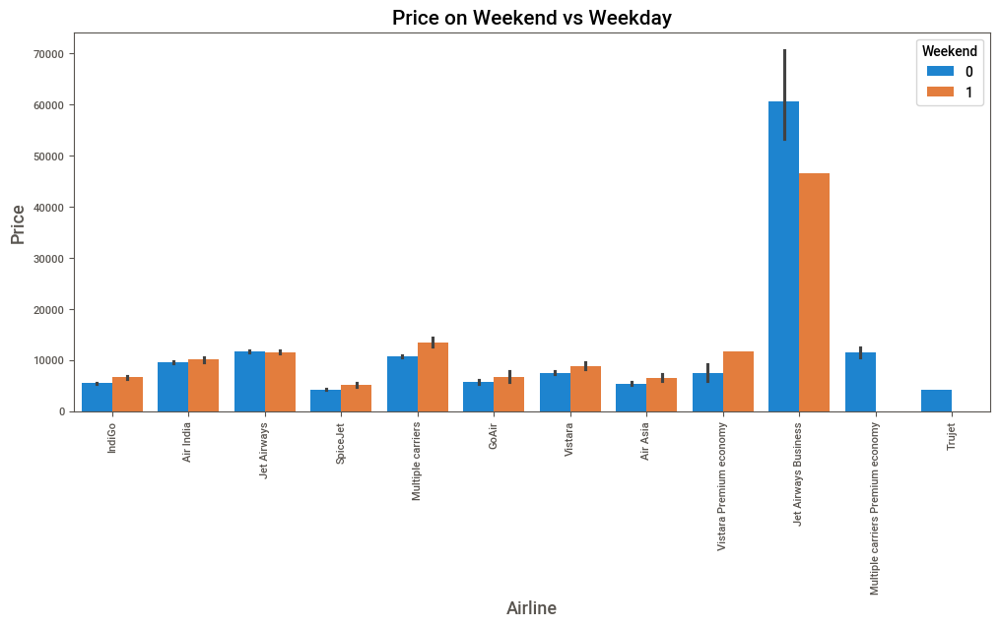

In [20]:
plt.subplots(figsize=(12,5))
sns.barplot(data=day_df,x='Airline',y='Price',hue='Weekend')
plt.xlabel('Airline',size=13)
plt.xticks(rotation=90)
plt.ylabel('Price',size=13)
plt.title('Price on Weekend vs Weekday',size=15)
plt.show()

# Insights
* The Price of tickets is higher on weekends.

# Feature Engineering

# 1. Date_of_Journey

In [21]:
#Extracting day, month, year from Date_of_Journey column and store them in new columns.

data['Journey_date']=data['Date_of_Journey'].str.split('/').str[0].astype(int)
data['Journey_month']=data['Date_of_Journey'].str.split('/').str[1].astype(int)
data['Journey_year']=data['Date_of_Journey'].str.split('/').str[2].astype(int)

In [22]:
data.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Journey_date,Journey_month,Journey_year
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,24,3,2019
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,1,5,2019
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,9,6,2019
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,12,5,2019
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,1,3,2019


In [23]:
#'Date_of_Journey' column is not required, so we can drop the 'Date_of_Journey' column.
data=data.drop(['Date_of_Journey'],axis=1)

In [24]:
data['Journey_year'].value_counts()

Journey_year
2019    10683
Name: count, dtype: int64

In [25]:
# 'Journey_year' column has same value("2019") for all the rows, so we can drop it.
data=data.drop(['Journey_year'],axis=1)
data.head()

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Journey_date,Journey_month
0,IndiGo,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,24,3
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,1,5
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,9,6
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,12,5
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,1,3


# 2.Total_Stops

In [26]:
#Total_Stops
data['Total_Stops']=data['Total_Stops'].str.split(" ").str[0]
data['Total_Stops']=data['Total_Stops'].replace('non-stop','0')
data.head()

,Airline,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,Journey_date,Journey_month
0,IndiGo,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,0,No info,3897,24,3
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2,No info,7662,1,5
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2,No info,13882,9,6
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1,No info,6218,12,5
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1,No info,13302,1,3


# 3.Arrival_Time and Departue_Time

In [27]:
#Extracting hours and minute from Arrival_Time and Departue_Time.

#Arrival_Time
data["Arrival_hour"] = pd.to_datetime(data["Arrival_Time"]).dt.hour
data["Arrival_min"] = pd.to_datetime(data["Arrival_Time"]).dt.minute

# Now we can drop Arrival_Time as it is of no use
data.drop(["Arrival_Time"], axis = 1, inplace = True)

In [28]:
#Dep_Time
data["Dep_hour"] = pd.to_datetime(data["Dep_Time"]).dt.hour
data["Dep_min"] = pd.to_datetime(data["Dep_Time"]).dt.minute

# Now we can drop Departure_Time as it is of no use
data.drop(["Dep_Time"], axis = 1, inplace = True)

In [29]:
data.head()

,Airline,Source,Destination,Route,Duration,Total_Stops,Additional_Info,Price,Journey_date,Journey_month,Arrival_hour,Arrival_min,Dep_hour,Dep_min
0,IndiGo,Banglore,New Delhi,BLR → DEL,2h 50m,0,No info,3897,24,3,1,10,22,20
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,7h 25m,2,No info,7662,1,5,13,15,5,50
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,19h,2,No info,13882,9,6,4,25,9,25
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,5h 25m,1,No info,6218,12,5,23,30,18,5
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,4h 45m,1,No info,13302,1,3,21,35,16,50


# 4.Route and Additional_Info
1.The Route column tells about the journey'path. Route column can be removed because the "Total_Stops" column has already the same values.

2.'Additional_Info' column can be dropped since maximum of rows has no information.

In [30]:
data.drop(['Route','Additional_Info'],axis=1,inplace=True)

# 5.Duration Column
Extracting Hours and minute from the Duration column and converting hours to minute and finding total duartion in minutes.

In [31]:
data['Duration_hr']=data['Duration'].str.split(' ').str[0].str.split('h').str[0]
data['Duration_min']=data['Duration'].str.split(' ').str[1].str.split('m').str[0]
data.head()

,Airline,Source,Destination,Duration,Total_Stops,Price,Journey_date,Journey_month,Arrival_hour,Arrival_min,Dep_hour,Dep_min,Duration_hr,Duration_min
0,IndiGo,Banglore,New Delhi,2h 50m,0,3897,24,3,1,10,22,20,2,50
1,Air India,Kolkata,Banglore,7h 25m,2,7662,1,5,13,15,5,50,7,25
2,Jet Airways,Delhi,Cochin,19h,2,13882,9,6,4,25,9,25,19,NaN
3,IndiGo,Kolkata,Banglore,5h 25m,1,6218,12,5,23,30,18,5,5,25
4,IndiGo,Banglore,New Delhi,4h 45m,1,13302,1,3,21,35,16,50,4,45


In [32]:
data['Duration_hr'].str.contains('h').sum()

0

In [33]:
data['Duration_hr'].str.contains('m').sum()

1

In [34]:
data['Duration_min'].str.contains('h').sum()

0

In [35]:
data['Duration_min'].str.contains('m').sum()

0

In [36]:
data[data['Duration_hr'].str.contains('m')]

,Airline,Source,Destination,Duration,Total_Stops,Price,Journey_date,Journey_month,Arrival_hour,Arrival_min,Dep_hour,Dep_min,Duration_hr,Duration_min
6474,Air India,Mumbai,Hyderabad,5m,2,17327,6,3,16,55,16,50,5m,NaN


In [37]:
data.loc[[6474],'Duration_min']=data.loc[[6474],'Duration_hr']

In [38]:
data.loc[data['Duration_min']=='5m','Duration_min']=5

In [39]:
data.head()

,Airline,Source,Destination,Duration,Total_Stops,Price,Journey_date,Journey_month,Arrival_hour,Arrival_min,Dep_hour,Dep_min,Duration_hr,Duration_min
0,IndiGo,Banglore,New Delhi,2h 50m,0,3897,24,3,1,10,22,20,2,50
1,Air India,Kolkata,Banglore,7h 25m,2,7662,1,5,13,15,5,50,7,25
2,Jet Airways,Delhi,Cochin,19h,2,13882,9,6,4,25,9,25,19,NaN
3,IndiGo,Kolkata,Banglore,5h 25m,1,6218,12,5,23,30,18,5,5,25
4,IndiGo,Banglore,New Delhi,4h 45m,1,13302,1,3,21,35,16,50,4,45


In [40]:
data['Duration_hr']=data['Duration_hr'].replace('5m','0')

In [41]:
data['Duration_hr'].str.contains('m').sum()

0

In [42]:
data['Duration_hr']=data['Duration_hr'].astype(int)

In [43]:
data['Duration_min']=data['Duration_min'].fillna('0')

In [44]:
data['Duration_min']=data['Duration_min'].astype(int)

In [45]:
data.head()

,Airline,Source,Destination,Duration,Total_Stops,Price,Journey_date,Journey_month,Arrival_hour,Arrival_min,Dep_hour,Dep_min,Duration_hr,Duration_min
0,IndiGo,Banglore,New Delhi,2h 50m,0,3897,24,3,1,10,22,20,2,50
1,Air India,Kolkata,Banglore,7h 25m,2,7662,1,5,13,15,5,50,7,25
2,Jet Airways,Delhi,Cochin,19h,2,13882,9,6,4,25,9,25,19,0
3,IndiGo,Kolkata,Banglore,5h 25m,1,6218,12,5,23,30,18,5,5,25
4,IndiGo,Banglore,New Delhi,4h 45m,1,13302,1,3,21,35,16,50,4,45


In [46]:
#Converting hrs and minutes into minutes 
data['Duration']=(data['Duration_hr']*60) + data['Duration_min']
data=data.drop(['Duration_hr','Duration_min'],axis=1)
data.head()

,Airline,Source,Destination,Duration,Total_Stops,Price,Journey_date,Journey_month,Arrival_hour,Arrival_min,Dep_hour,Dep_min
0,IndiGo,Banglore,New Delhi,170,0,3897,24,3,1,10,22,20
1,Air India,Kolkata,Banglore,445,2,7662,1,5,13,15,5,50
2,Jet Airways,Delhi,Cochin,1140,2,13882,9,6,4,25,9,25
3,IndiGo,Kolkata,Banglore,325,1,6218,12,5,23,30,18,5
4,IndiGo,Banglore,New Delhi,285,1,13302,1,3,21,35,16,50


# Checking for null values


In [47]:
data.isnull().sum()

Airline          0
Source           0
Destination      0
Duration         0
Total_Stops      1
Price            0
Journey_date     0
Journey_month    0
Arrival_hour     0
Arrival_min      0
Dep_hour         0
Dep_min          0
dtype: int64

In [48]:
data['Total_Stops'].value_counts()

Total_Stops
1    5625
0    3491
2    1520
3      45
4       1
Name: count, dtype: int64

In [49]:
data.dtypes

Airline          object
Source           object
Destination      object
Duration          int32
Total_Stops      object
Price             int64
Journey_date      int32
Journey_month     int32
Arrival_hour      int32
Arrival_min       int32
Dep_hour          int32
Dep_min           int32
dtype: object

In [50]:
# '1' is most frequent occuring value. So fill Total_Stops column null values by '1'
data['Total_Stops']=data['Total_Stops'].fillna('1')

In [51]:
data['Total_Stops']=data['Total_Stops'].astype(int)

In [52]:
data.isnull().sum()

Airline          0
Source           0
Destination      0
Duration         0
Total_Stops      0
Price            0
Journey_date     0
Journey_month    0
Arrival_hour     0
Arrival_min      0
Dep_hour         0
Dep_min          0
dtype: int64

# Using Encoding to handle categorical data
Features with categorical data

1.Airline

2.Source

3.Destination

In [53]:
data['Airline'].value_counts()

Airline
Jet Airways                          3849
IndiGo                               2053
Air India                            1752
Multiple carriers                    1196
SpiceJet                              818
Vistara                               479
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: count, dtype: int64

In [54]:
data['Source'].value_counts()

Source
Delhi       4537
Kolkata     2871
Banglore    2197
Mumbai       697
Chennai      381
Name: count, dtype: int64

In [55]:
data['Destination'].value_counts()

Destination
Cochin       4537
Banglore     2871
Delhi        1265
New Delhi     932
Hyderabad     697
Kolkata       381
Name: count, dtype: int64

In [56]:
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
for i in ['Airline','Source','Destination']:
    data[i]=l.fit_transform(data[i])
data

,Airline,Source,Destination,Duration,Total_Stops,Price,Journey_date,Journey_month,Arrival_hour,Arrival_min,Dep_hour,Dep_min
0,3,0,5,170,0,3897,24,3,1,10,22,20
1,1,3,0,445,2,7662,1,5,13,15,5,50
2,4,2,1,1140,2,13882,9,6,4,25,9,25
3,3,3,0,325,1,6218,12,5,23,30,18,5
4,3,0,5,285,1,13302,1,3,21,35,16,50
5,8,3,0,145,0,3873,24,6,11,25,9,0
6,4,0,5,930,1,11087,12,3,10,25,18,55
7,4,0,5,1265,1,22270,1,3,5,5,8,0
8,4,0,5,1530,1,11087,12,3,10,25,8,55
9,6,2,1,470,1,8625,27,5,19,15,11,25


# Feature Selection
Finding out the best feature which will contribute and have good relation with the target variable(Price).

We will use heatmap to find correlation between features.

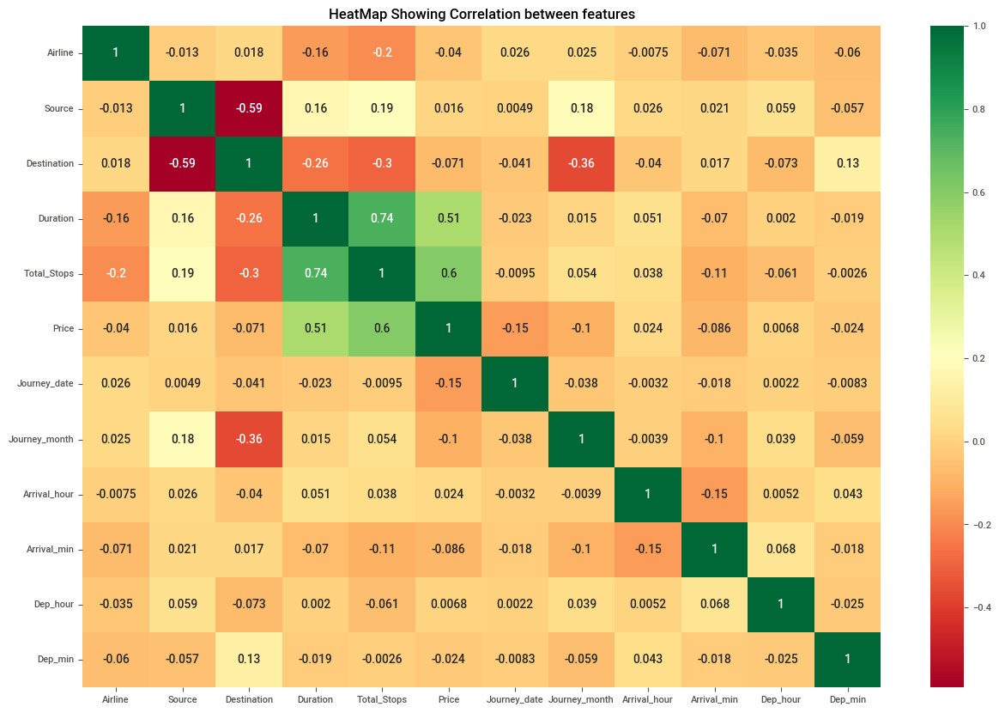

In [57]:
plt.figure(figsize=(15,10))
sns.heatmap(data.corr(),annot=True,cmap='RdYlGn')
plt.title("HeatMap Showing Correlation between features" )
plt.show()

# Insights
* Price and Total Stops has high correlation.
* Price and flight duration has high correlation.
* Duration and Total Stops has high correlation.

# Building Machine Learning Model
* Linear Regression
* Decision Tree
* Random Forest

In [58]:
#splitting data into x and y
x=data.drop(["Price"],axis=1)
y=data.loc[:,["Price"]].values

In [59]:
#Splitting dataset into train and test data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)


In [60]:
x_test

,Airline,Source,Destination,Duration,Total_Stops,Journey_date,Journey_month,Arrival_hour,Arrival_min,Dep_hour,Dep_min
6076,4,3,0,750,1,18,5,18,15,5,45
3544,2,2,1,540,1,3,6,19,35,10,35
7313,4,3,0,345,1,1,5,19,50,14,5
5032,3,1,4,140,0,24,5,17,5,14,45
2483,4,2,1,335,1,21,5,4,25,22,50
9894,6,2,1,690,1,6,5,19,0,7,30
346,4,2,1,540,1,27,5,19,0,10,0
6366,4,0,2,180,0,15,4,22,50,19,50
8270,8,1,4,140,0,21,6,20,5,17,45
3393,4,2,1,660,1,21,5,19,0,8,0


In [61]:
y_test

array([[10844],
       [ 4959],
       [14781],
       ...,
       [ 7452],
       [ 4823],
       [13731]], dtype=int64)

In [62]:
x_train.shape

(8546, 11)

In [63]:
y_train.shape

(8546, 1)

# Import model

In [64]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error

In [65]:
#Function to train the models
def predict(algorithm):
    print("Algorithm:",algorithm)
    model=algorithm.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    print("The Predicted Price values are:",y_pred)
    print('\n')
    r2=r2_score(y_test,y_pred)
    print("R2 Score:",r2)
    print('MAE:',(mean_absolute_error(y_test,y_pred)))
    print('MSE:',(mean_squared_error(y_test,y_pred)))
    return(r2)

In [66]:
lr=predict(LinearRegression())

Algorithm: LinearRegression()
The Predicted Price values are: [[8565.99024932]
 [9103.76531323]
 [9839.69536579]
 ...
 [8512.07954512]
 [6296.34649814]
 [9120.61421357]]


R2 Score: 0.4297235057929025
MAE: 2472.5951662188572
MSE: 12069312.365751239


In [67]:
dt=predict(DecisionTreeRegressor())

Algorithm: DecisionTreeRegressor()
The Predicted Price values are: [14781.  4959.  5608. ...  6152.  4823. 14781.]


R2 Score: 0.6591876203866893
MAE: 1412.660942130713
MSE: 7212941.633491655


In [68]:
rf=predict(RandomForestRegressor())

Algorithm: RandomForestRegressor()
The Predicted Price values are: [13899.35702381  5526.6        12711.61016667 ...  6731.89
  4776.77       11419.94416667]


R2 Score: 0.7966655120768134
MAE: 1202.0370049070152
MSE: 4303364.200355411


* The Random Forest Regressor model turned out to be the most accurate.
* We will apply Hyperparameter tunning to improve the accuracy.

# HyperParameter Tunning

In [69]:
#Applying Randomized search to find the best Parameters.

#Random Search sets up a grid of hyperparameter values and selects random combinations to train the model and score.
#This allows you to explicitly control the number of parameter combinations that are attempted.
#The number of search iterations is set based on time or resources.
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]#List Comprehension-using for loop in list
max_features = ['auto', 'sqrt']#maximum number of features allowed to try in individual tree
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]#List Comprehension-using for loop in list
max_depth.append(None)
min_samples_split = [2, 5, 10]#minimum number of samples required to split an internal node
min_samples_leaf = [1, 2, 4]#minimum number of samples required to be at a leaf node.
bootstrap = [True, False]#sampling

#dictionary for hyperparameters
random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

rf_clf1 = RandomForestRegressor(random_state=42)#model

rf_cv = RandomizedSearchCV(estimator=rf_clf1, scoring='accuracy',param_distributions=random_grid, n_iter=100, cv=3,
                               verbose=2, random_state=42, n_jobs=-1)
#estimator--number of decision tree
#scoring--->performance matrix to check performance
#param_distribution-->hyperparametes(dictionary we created)
#n_iter--->Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.default=10
##cv------> number of flods
#verbose=Controls the verbosity: the higher, the more messages.
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.

rf_cv.fit(x_train, y_train)##training data on randomsearch cv
rf_best_params = rf_cv.best_params_##it will give you best parameters
print(f"Best paramters: {rf_best_params})")##printing  best parameters

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best paramters: {'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': True})


In [70]:
rf_clf2 = RandomForestRegressor(n_estimators= 400, min_samples_split= 5, min_samples_leaf= 1, max_features='sqrt', max_depth= 30, bootstrap= True)#passing best parameter to randomforest
rf_clf2.fit(x_train, y_train)#training
y_predict1=rf_clf2.predict(x_test)#testing
y_predict1

array([13213.86268651,  5547.22028436, 12058.88691964, ...,
        6535.32463763,  4821.98320779, 11661.50244237])

In [71]:
r2_score(y_test,y_predict1)

0.8217709810078563

* After hyperparameter Tunning, the accuracy increases.

In [72]:
print('r2_score:',r2_score(y_test,y_predict1))
print('MAE:',mean_absolute_error(y_test,y_predict1))
print('MSE:',mean_squared_error(y_test,y_predict1))
print('RMSE:',np.sqrt(mean_squared_error(y_test,y_predict1)))

r2_score: 0.8217709810078563
MAE: 1218.3772749810983
MSE: 3772032.9080868866
RMSE: 1942.1722138077475


For RandomForestRegressor,
* Before hyperparameter Tunning,R2 score=79.2%
* After hyperparameter Tunning, R2 score=81.8%

# Conclusion
* The Accuracy of Random forest is more than Decision tree.
* We have used RandomForestRegressor for training the model and improve its accuracy by doing hyperparameter tunning, as a result we have train our RandomForest model to forecast fares of flights tickets, with an r2 score of 82%.
